# **Analyse Exploratoire de données vidéos**

## **Plans**

- ### Importer les bibliothèques pour la manipulation de données
- ### Chargement du données enregistrée sur les vidéos
- ### Analyse de repartition des espèces dans chaque video
- ### Analyse de qualités des vidéos

## **Importer les bibliothèques pour la manipulation de données**

In [1]:
import pandas as pd  # Pour la manipulation et d'analyse de données
import numpy  as np  # bibliothèque pour le calcul scientifique
import seaborn as sns  # pour dessiner des graphiques statistiques attractifs et informatifs
import matplotlib.pyplot as plt  # bibliothèque de visualisation
import os  # pour manipuler les fichiers et les répertoires
import cv2  # pour le traitement des vidéos et images

## **Chargement du données enregistrée sur les vidéos**

In [2]:
df=pd.read_excel('vidéos BathyBot analyse.xlsx', skiprows=1) # Données contenant des informations sur les vidéos comme des espèces ,abondance, etc..

In [3]:
df

,Unnamed: 0,Videos,Date,Heure_debut,Duree,Espece,Nombre,Heure_entree,Seconde_entree,Heure_sortie,...,Temps,Mobilite,Tracking,Commentaire,Lumiere,Turbidite,Cam,M_A,Orientation,Capture
0,NaN,vlc-record-2023-04-20-09h05m35s-rstp__192.168....,20/04/2023,2024-05-17 09:05:35,56.0,Concombre de mer,1.0,2024-05-17 09:05:35,00:00:00,2024-05-17 09:06:31,...,00:00:56,Mobile,Oui,En vol,Normal,2.0,Sony,Manuel,En face + vers le fond,NaN
1,NaN,vlc-record-2023-04-20-09h05m35s-rstp__192.168....,20/04/2023,2024-05-17 09:05:35,56.0,Posidonie,1.0,2024-05-17 09:05:35,00:00:00,2024-05-17 09:06:31,...,00:00:56,Sessile,Non,NaN,Normal,2.0,Sony,Manuel,En face + vers le fond,NaN
2,NaN,vlc-record-2023-04-20-09h06m44s-rstp__192.168....,20/04/2023,2024-05-17 09:06:44,3.0,Posidonie,1.0,2024-05-17 09:06:44,00:00:00,2024-05-17 09:06:47,...,00:00:03,Sessile,Non,NaN,Normal,0.0,Sony,Manuel,Vers le fond,NaN
3,NaN,vlc-record-2023-04-21-10h15m45s-rstp__192.168....,21/04/2023,2024-05-17 10:15:45,13.0,Amphipode,1.0,2024-05-17 10:15:45,00:00:00,2024-05-17 10:15:47,...,00:00:02,Mobile,Non,NaN,Normal,1.0,Sony,Manuel,Vers le fond,NaN
4,NaN,vlc-record-2023-04-21-10h15m45s-rstp__192.168....,21/04/2023,2024-05-17 10:15:45,13.0,Posidonie,1.0,2024-05-17 10:15:45,00:00:00,2024-05-17 10:15:58,...,00:00:13,Sessile,Non,NaN,Normal,1.0,Sony,Manuel,Vers le fond,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2153,NaN,Transect_benthic202400203220811,03/02/2024,2024-05-17 22:08:11,351.0,Concombre de mer,1.0,2024-05-17 22:10:20,00:02:09,2024-05-17 22:11:06,...,00:00:46,NaN,Non,NaN,Normal,4.0,Sony,Automatique,Vers le fond,NaN
2154,NaN,Transect_benthic202400203220811,03/02/2024,2024-05-17 22:08:11,351.0,Espèce 6,1.0,2024-05-17 22:13:01,00:04:50,2024-05-17 22:13:48,...,00:00:47,NaN,Non,NaN,Normal,4.0,Sony,Automatique,Vers le fond,NaN
2155,NaN,Transect_benthic202400203220811,03/02/2024,2024-05-17 22:08:11,351.0,Crevette,1.0,2024-05-17 22:12:41,00:04:30,2024-05-17 22:12:46,...,00:00:05,NaN,Non,NaN,Normal,4.0,Sony,Automatique,Vers le fond,Crevette_2
2156,NaN,Transect_bathyreef_20240204041531,04/02/2024,2024-05-17 04:15:31,52.0,Siphonophore,1.0,2024-05-17 04:15:31,00:00:00,2024-05-17 04:15:36,...,00:00:05,NaN,Non,Zoom sur BathyReef la moitié du temps,Normal,5.0,Sony,Automatique,Vers le fond + en face,NaN


### Selectionner les vidéos disponibles pour l'apprentissage

In [5]:
df=df[df['Videos'].str.contains(r'vlc-record-2023./*|XNP-6040H./*', case=False, na=False)]

## **Analyse de repartition des espèces dans chaque video**

### Répartition des espèces en global

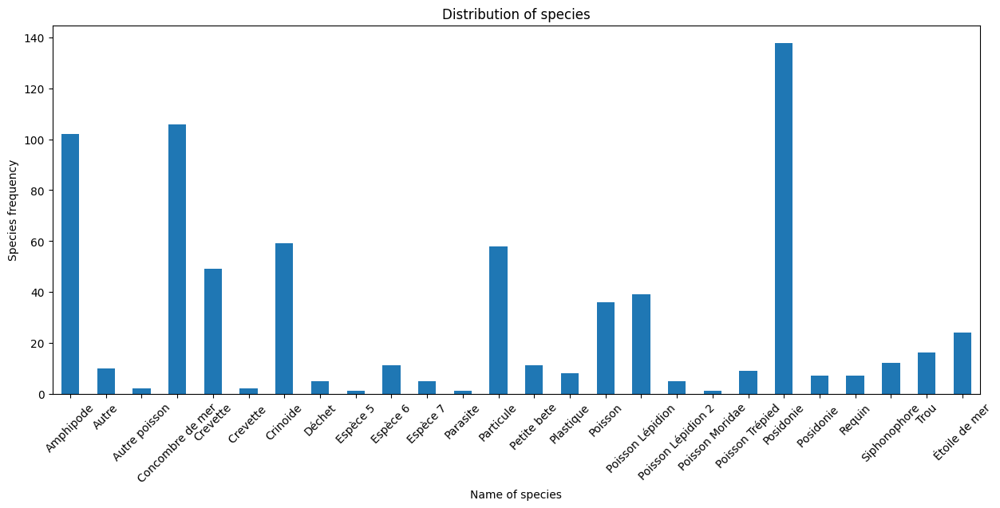

In [6]:
# Compter le nombre d'espèces uniques par vidéo
unique_species_per_video = df.groupby('Espece')['Videos'].nunique()

plt.figure(figsize=(15, 6))
unique_species_per_video.plot(kind='bar')
plt.xlabel('Name of species')
plt.ylabel("Species frequency")
plt.title("Distribution of species")
plt.xticks(rotation=45)
plt.show()

### Répartition des espèces par vidéo

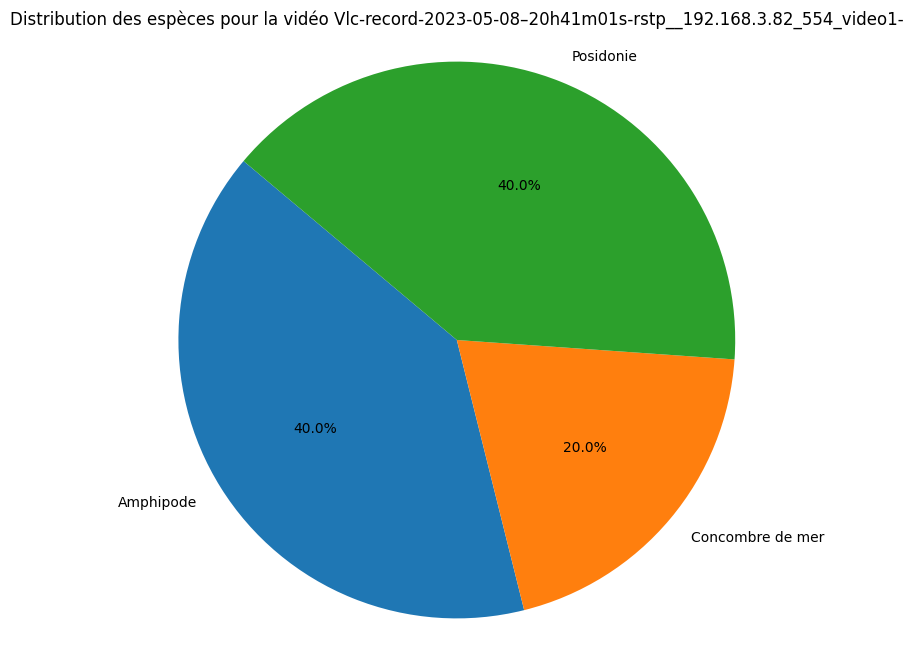

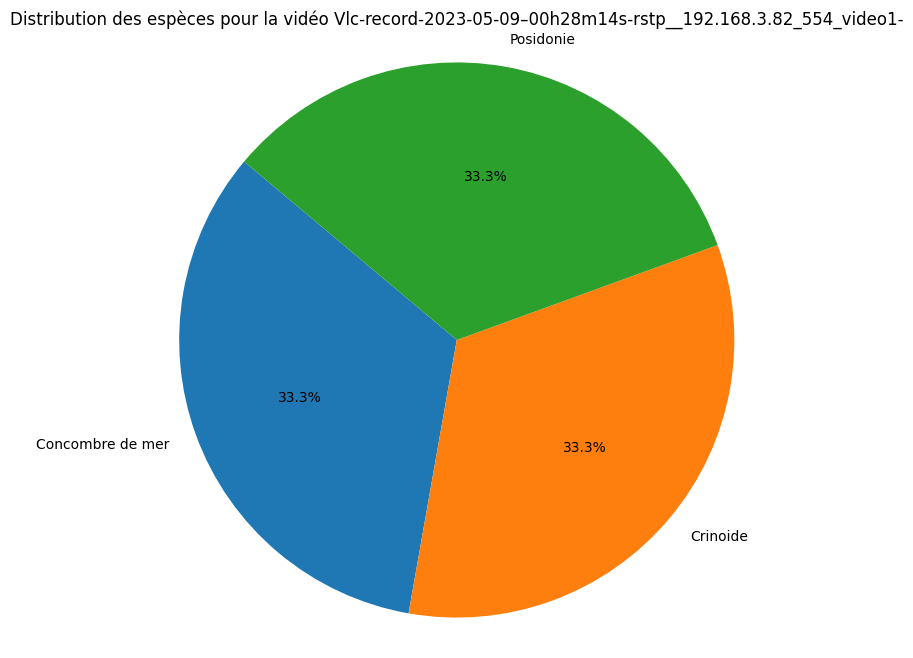

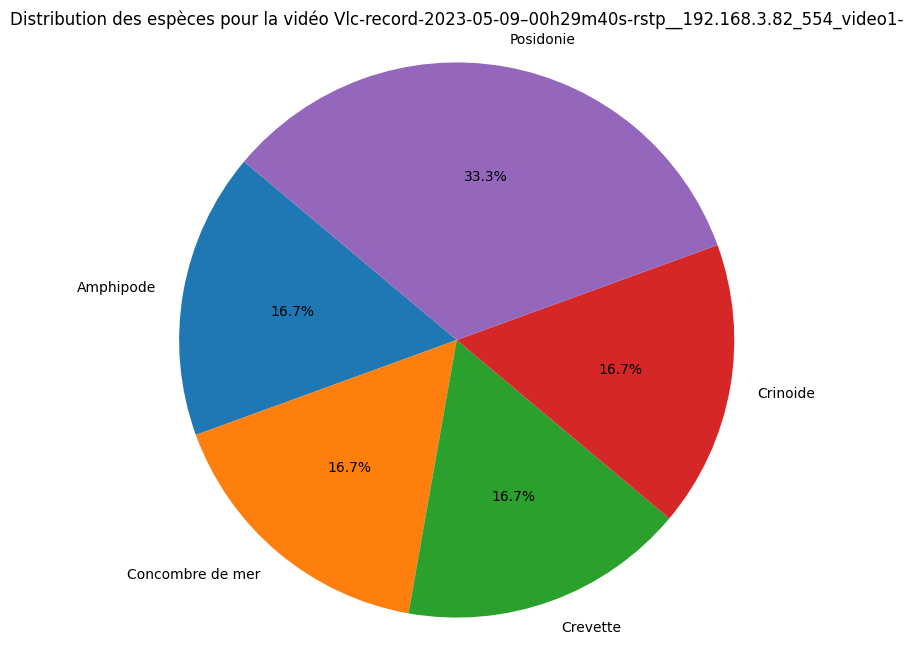

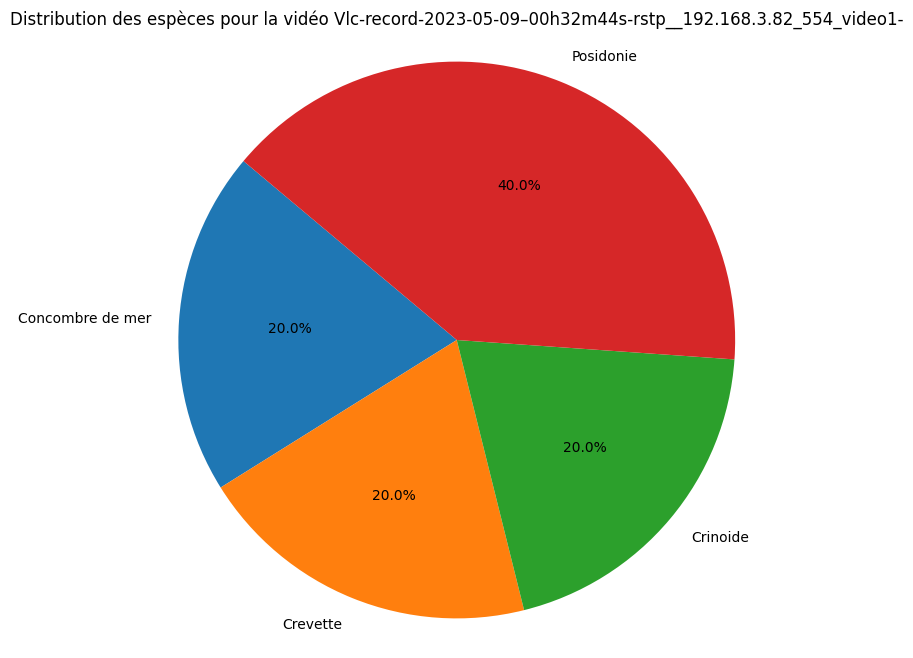

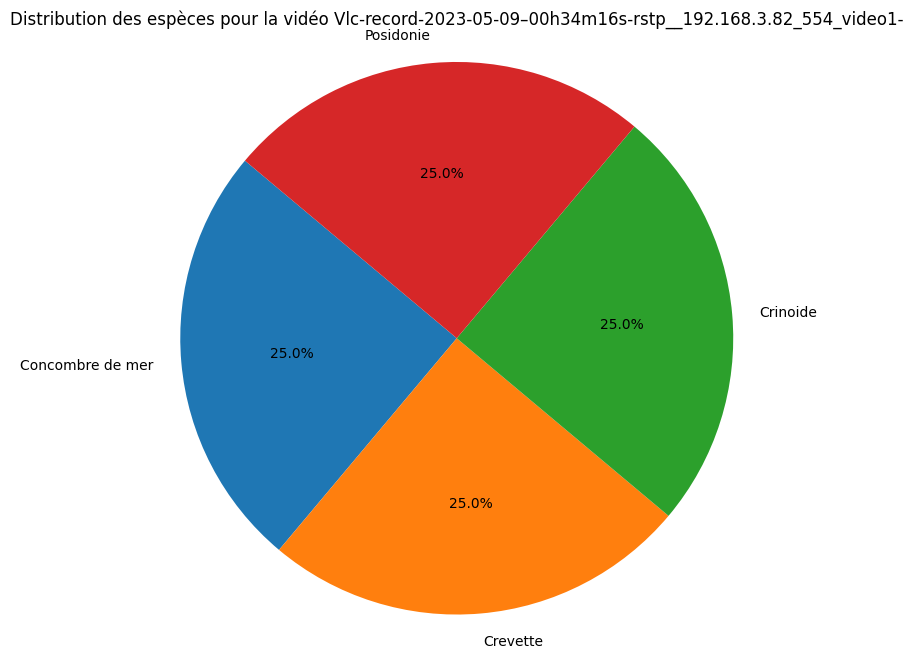

...

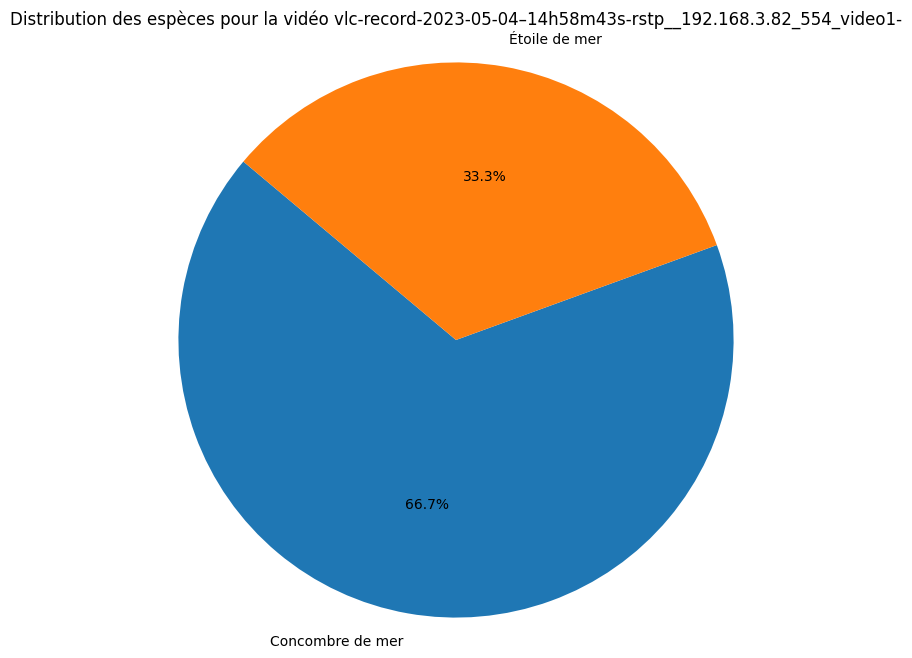

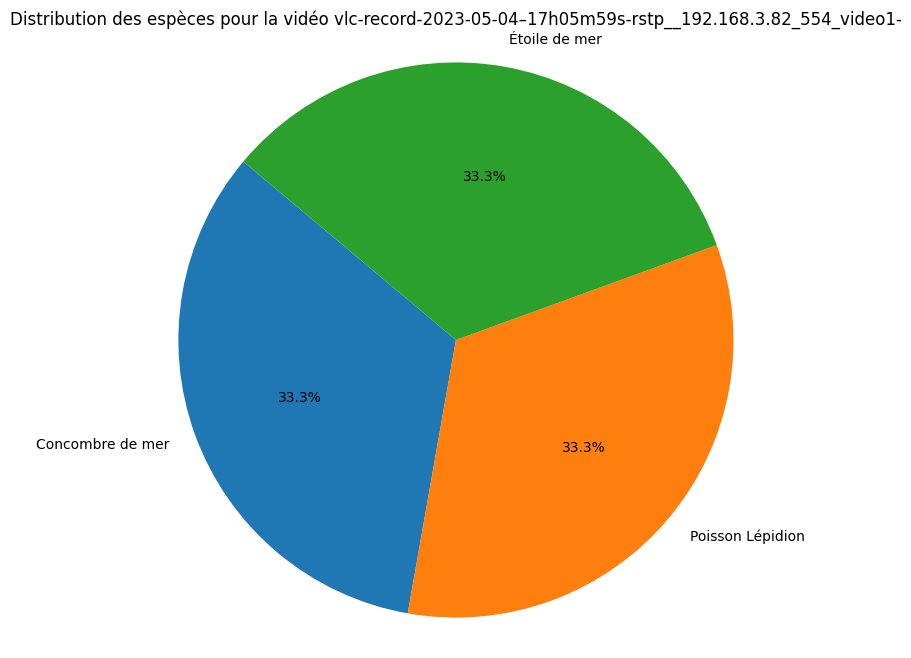

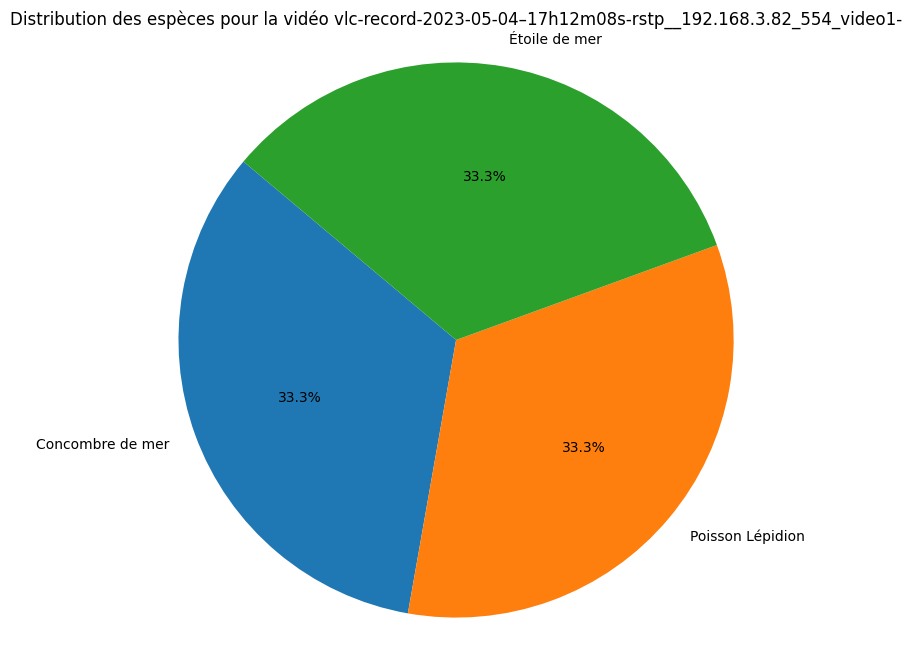

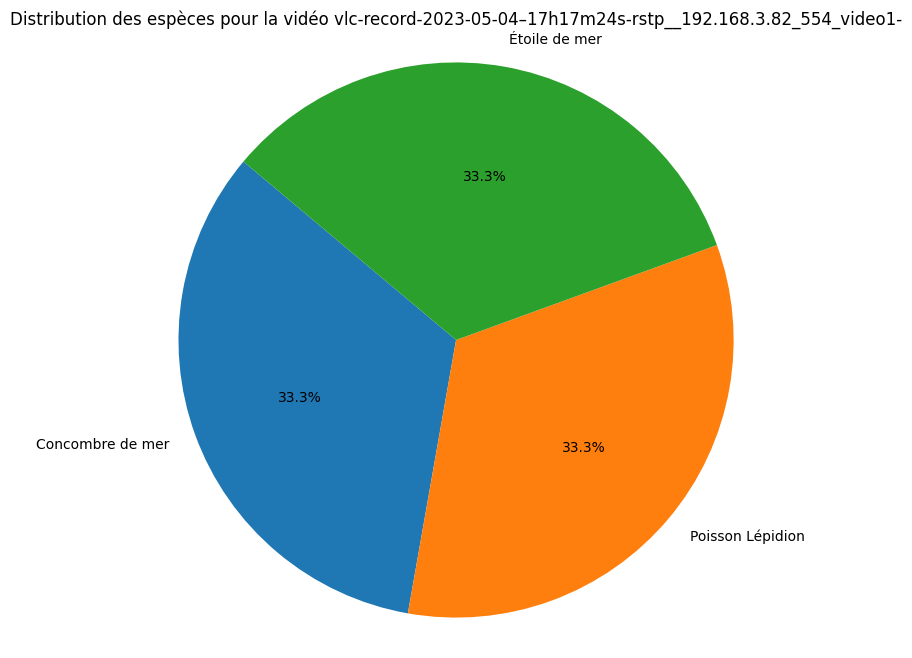

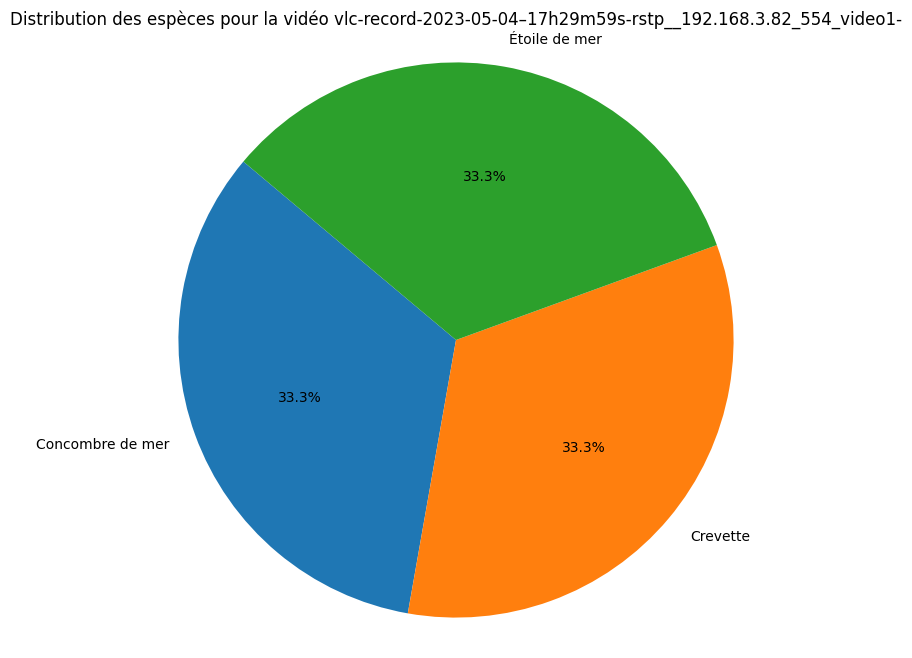

In [8]:
# Selectionner les variables à étudier pour la repartition
grouped_data = df.groupby(['Videos', 'Espece','Nombre']).size().reset_index(name='counts')

# Obtenir les valeurs uniques des vidéos
unique_videos = grouped_data['Videos'].unique()

for video in unique_videos:
    subset = grouped_data[grouped_data['Videos'] == video]
    counts = subset['Nombre']
    species_labels = subset['Espece']

    plt.figure(figsize=(8, 8))
    plt.pie(counts, labels=species_labels, autopct='%1.1f%%', startangle=140)
    plt.title(f'Distribution des espèces pour la vidéo {video}')
    plt.axis('equal')  # Pour s'assurer que le cercle est dessiné comme un cercle
    
    # Afficher la figure après l'enregistrement
    plt.show()

## **Analyse de qualités des vidéos ( Luminosité et Contraste )**

Analyse de la qualité de la vidéo : XNP-6040H 20230607 170805.avi


[avi @ 0x387a000] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x52e11c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230425 104648.avi


[avi @ 0x3ae2d40] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230510 181524.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x5988a00] Invalid pixel format.
[rawvideo @ 0x5988a00] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230721 135912.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x5988a00] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230621 101207.avi


[avi @ 0x55b9d40] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3a63940] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230425 105142.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x382cbc0] Invalid pixel format.
[rawvideo @ 0x382cbc0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230502 170306.avi


[avi @ 0x6f87fc0] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x382cbc0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230703 222941.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230629 161628.avi


[avi @ 0x71a0300] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x4ab2bc0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230623 160018.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230425 105742.avi


[avi @ 0x3b11d80] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230721 150556.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230630 100742.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f65140] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230623 153949.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230915 163734.avi


[avi @ 0x382cd40] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 205509.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230510 201853.avi


[avi @ 0x3a61240] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230504 143832.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230629 160444.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f65140] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 213724.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230828 103742.avi


[avi @ 0x592b4c0] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230615 112713.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230828 103611.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x4ab2bc0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230626 164635.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230626 164222.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230810 094034.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230810 093544.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230504 130742.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f65140] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230818 121755.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 162833.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230703 224458.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230530 092008.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230721 141149.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230607 171052.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230510 153810.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f65140] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230510 181529.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20231012 093926.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230504 140337.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x4ab2bc0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230721 135817.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230510 153753.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230425 105801.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 214920.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230919 092740.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20231012 112514.avi


[avi @ 0x3b11dc0] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230719 151535.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230504 125738.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230504 170713.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230629 160333.avi


[avi @ 0x71a0300] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230626 164724.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230510 201107.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f65140] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 233932.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 173259.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230629 160802.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20231014 092258.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230510 175709.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230504 145412.avi


[avi @ 0x5988180] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 234137.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f65140] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230630 114421.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230828 102902.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 223705.avi


[avi @ 0x58f7c40] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230510 153339.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230623 160616.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230828 104249.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230828 103058.avi


[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f65140] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230504 140101.avi


[avi @ 0x6f34340] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3a63940] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 170022.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230703 223511.avi


[avi @ 0x6f87fc0] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 223702.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230703 105643.avi


[avi @ 0x6f87fc0] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230824 105435.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 223401.avi


[avi @ 0x4cf1840] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230605 111337.avi
Analyse de la qualité de la vidéo : XNP-6040H 20230626 164213.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.
[rawvideo @ 0x3badb80] Invalid pixel format.
[avi @ 0x5314780] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x6f6ea80] Invalid pixel format.
[rawvideo @ 0x6f6ea80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 223709.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20231011 080847.avi


[avi @ 0x3b85580] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230504 130202.avi


[avi @ 0x3b85580] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230425 105646.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230621 150105.avi


[avi @ 0x71a0300] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3badb80] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20231010 153242.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 224647.avi


[avi @ 0x5890ac0] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x5a226c0] Invalid pixel format.


Analyse de la qualité de la vidéo : XNP-6040H 20230503 215814.avi


[avi @ 0x6a75740] Something went wrong during header parsing, tag [0][0][0][0] has size 1414744396, I will ignore it and try to continue anyway.
[rawvideo @ 0x3bae4c0] Invalid pixel format.


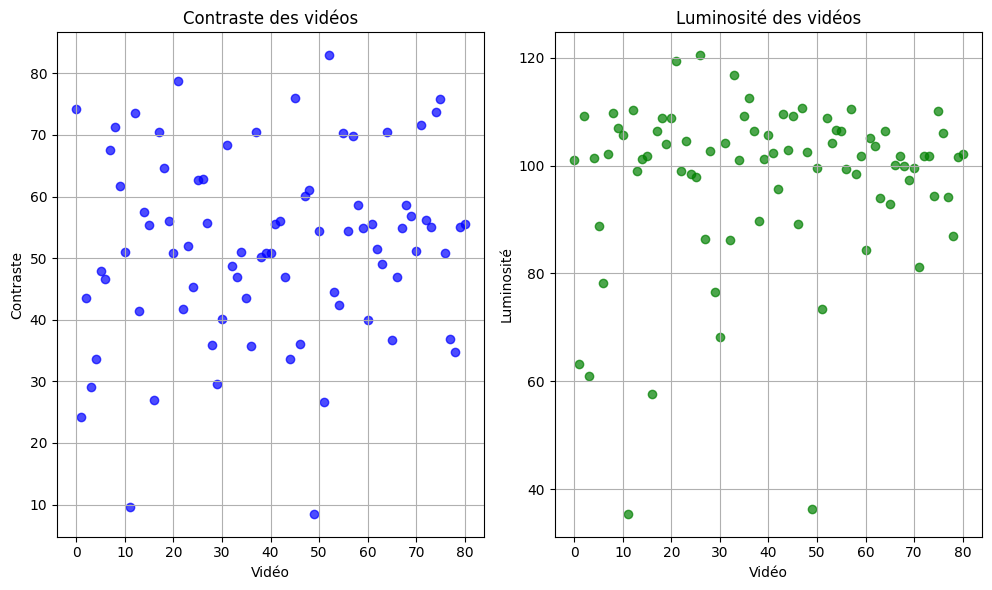

In [9]:
def load_videos(directory):
    video_paths = []
    for filename in os.listdir(directory):
        if filename.endswith((".mp4", ".avi")):
            video_paths.append(os.path.join(directory, filename))
    return video_paths

def calculate_quality(video_path):
    # Charger la vidéo
    video_capture = cv2.VideoCapture(video_path)

    # Initialiser les listes pour stocker les valeurs de contraste et de luminosité pour chaque image
    contrast_values = []
    brightness_values = []

    frame_count = 0

    while True:
        # Lire une image de la vidéo
        ret, frame = video_capture.read()

        # Vérifier si la lecture de la vidéo est terminée
        if not ret:
            break

        # Convertir l'image en niveaux de gris
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Calculer l'écart type de l'intensité des pixels (contraste)
        contrast = np.std(gray_frame)

        # Calculer la luminosité moyenne
        brightness = np.mean(gray_frame)

        # Ajouter les valeurs de contraste et de luminosité aux listes
        contrast_values.append(contrast)
        brightness_values.append(brightness)


        frame_count += 1

    # Libérer la capture vidéo
    video_capture.release()

    # Calculer les statistiques de qualité de la vidéo
    avg_contrast = np.mean(contrast_values)
    avg_brightness = np.mean(brightness_values)

    return avg_contrast, avg_brightness, frame_count

def main():
    # Répertoire contenant les vidéos
    video_directory = "dossier/contenant/le video"

    # Charger les vidéos
    video_paths = load_videos(video_directory)

    # Variables pour stocker les noms des vidéos et leurs mesures de qualité
    video_names = []
    contrast_values = []
    brightness_values = []
    

    # Analyser chaque vidéo
    for video_path in video_paths:
        video_name = os.path.basename(video_path)
        print(f"Analyse de la qualité de la vidéo : {video_name}")
        contrast, brightness, _ = calculate_quality(video_path)

        # Ajouter les noms et les valeurs de qualité de cette vidéo aux listes
        video_names.append(video_name)
        contrast_values.append(contrast)
        brightness_values.append(brightness)

    # Afficher les distributions graphiques
    output_dir = "/repertoire/sortie"  # Spécifiez le répertoire de sortie
    plot_scatter(contrast_values, brightness_values, output_dir)

def plot_scatter(contrast_values, brightness_values, output_dir):
    # Créer une figure et définir la taille
    plt.figure(figsize=(15, 6))

    # Plot contrast values
    plt.subplot(1, 3, 1)
    plt.scatter(range(len(contrast_values)), contrast_values, color='blue', alpha=0.7)
    plt.title('Contraste des vidéos')
    plt.xlabel('Vidéo')
    plt.ylabel('Contraste')
    plt.grid(True)

    # Plot brightness values
    plt.subplot(1, 3, 2)
    plt.scatter(range(len(brightness_values)), brightness_values, color='green', alpha=0.7)
    plt.title('Luminosité des vidéos')
    plt.xlabel('Vidéo')
    plt.ylabel('Luminosité')
    plt.grid(True)

    # Ajuster le placement des sous-graphiques pour éviter les chevauchements
    plt.tight_layout()

    # Enregistrer le graphique dans un fichier ( Optionnel)
    #output_file = os.path.join(output_dir, "quality_analysis.png")
    #plt.savefig(output_file)

    # Afficher le graphique
    plt.show()

if __name__ == "__main__":
    main()